In [10]:
import pandas as pd
# Set max columns to display
pd.set_option('display.max_columns', None)
import numpy as np
from sklearn import preprocessing as pre
import matplotlib.pyplot as plt

In [11]:
df_All_1 = pd.read_csv(r'C:\Users\saust\OneDrive\Desktop\GitRepo\Project-OptiC4\1 Preprocess\Merge Data\contData_all_Avg_1o2.csv')
df_All_2 = pd.read_csv(r'C:\Users\saust\OneDrive\Desktop\GitRepo\Project-OptiC4\1 Preprocess\Merge Data\contData_all_Avg_2o2.csv')
# Concatenate (union) the dataframes
df_All = pd.concat([df_All_1, df_All_2], ignore_index=True)

print(df_All.head())

   425_pct_Al  M_Value  C4_pct_Eth  C4_pct_H2O  C4_pct_Hex  \
0    6.307630  3.50893    2.508420    21.96340    0.659256   
1    6.308335  3.50863    2.511135    21.96865    0.659930   
2    6.309390  3.50818    2.515210    21.97655    0.660942   
3    6.310090  3.50788    2.517925    21.98185    0.661616   
4    6.310790  3.50758    2.520640    21.98715    0.662291   

   HydWtr_pct_Ammonia  HydWtr_Na2O   DI55152   FC55003       FC55552  \
0            0.908765     2.712180  0.925255  4919.290  41564.100000   
1            0.907643     2.805415  0.924281  5039.445  41558.250000   
2            0.905959     2.945270  0.923773  5268.620  41524.066667   
3            0.904837     3.038505  0.924103  5349.320  41500.275000   
4            0.903715     3.131740  0.924258  5563.165  41466.625000   

       FC55569  FFC55553  FFC55555    LC55555   PI55004   TC55552     TC55555  \
0  6918.110000  0.996975  0.751501  59.968800  1.306310  177.1880  180.125000   
1  6919.960000  0.998847  0.7505

In [12]:
# List of columns to exclude to run XGboost feature selection
exclude_columns = [#'Date',
                 'C4_pct_Hex', 'HydWtr_Na2O',
                 'TC55555'  
                   ]

# Create a new DataFrame without the excluded columnsd
df_All = df_All.drop(columns=exclude_columns)

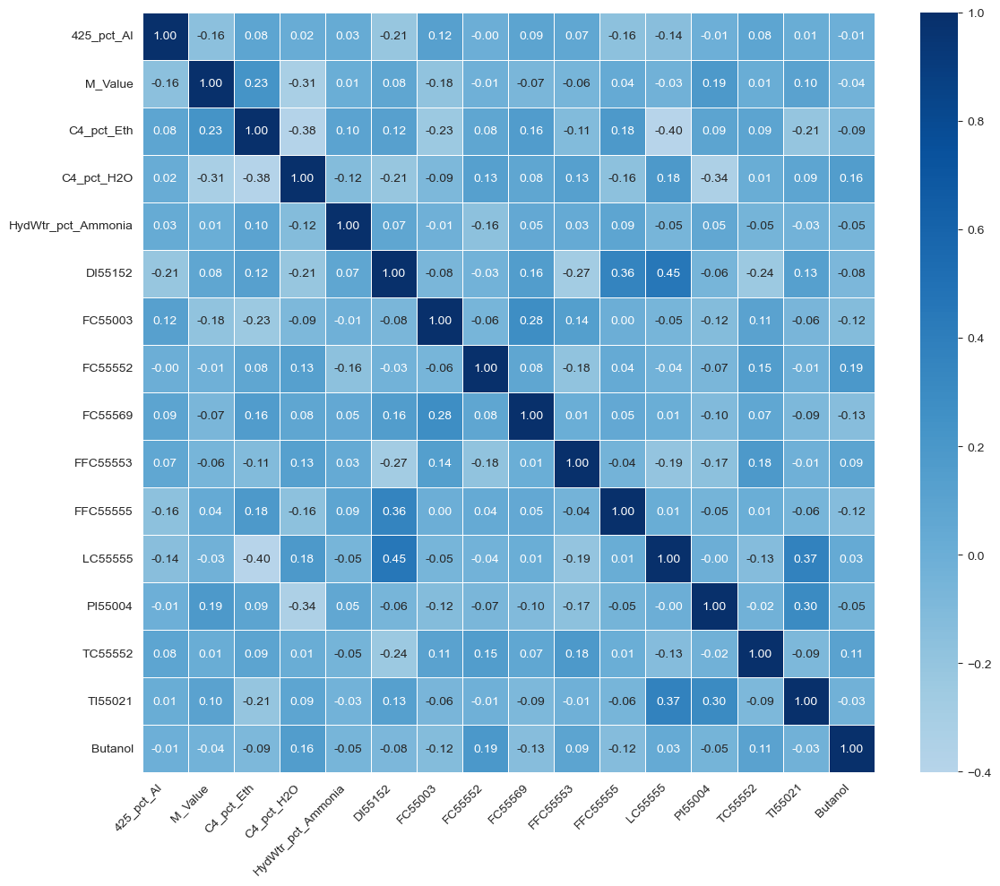

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_All is your DataFrame and has already been defined.

# Calculate the correlation matrix
correlation_matrix = df_All.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Generate a heatmap
sns.heatmap(correlation_matrix, cmap='Blues', center=0,
            linewidths=.5, annot=True, fmt='.2f')

# Adjust the layout to make it more readable
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

# Show the plot
plt.show()



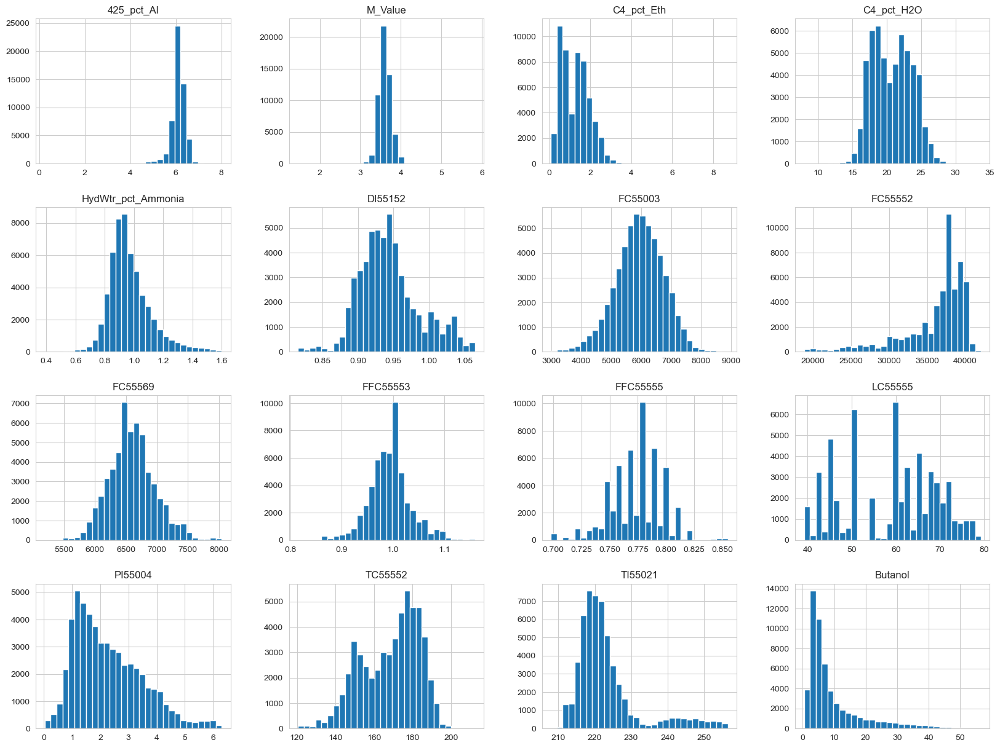

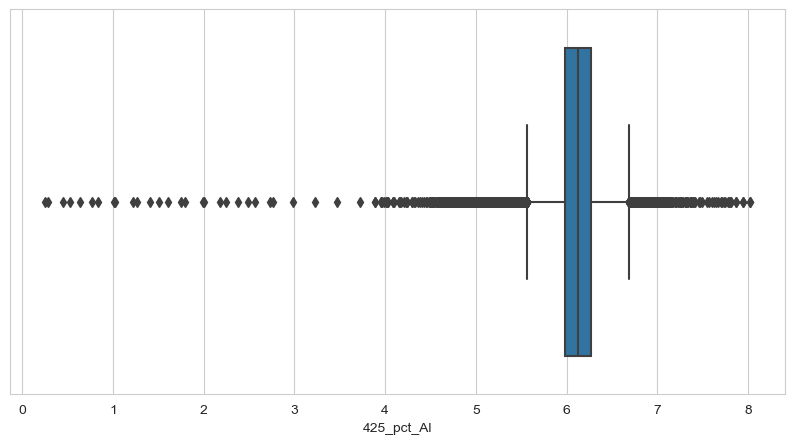

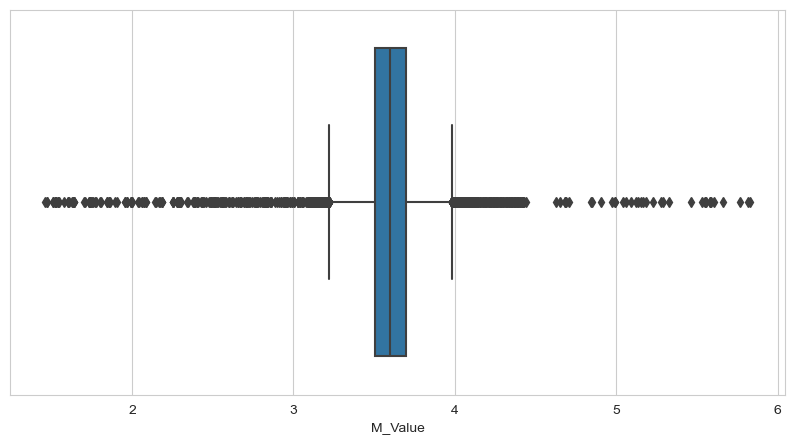

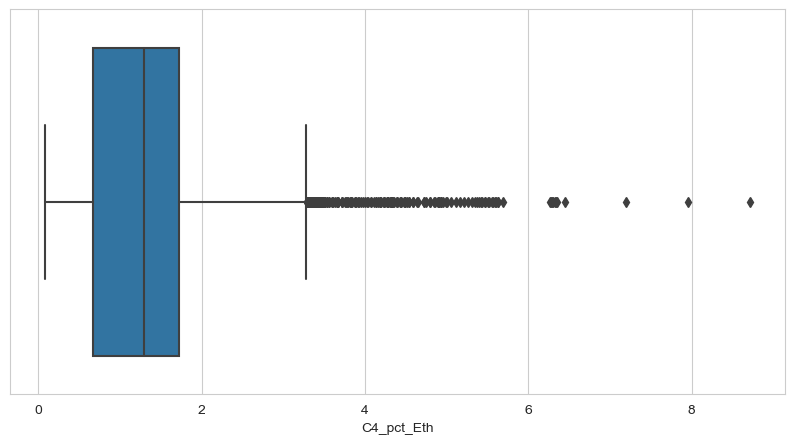

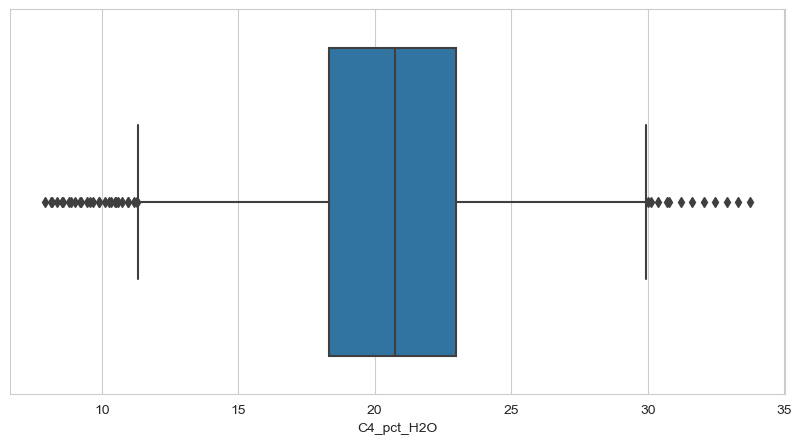

...

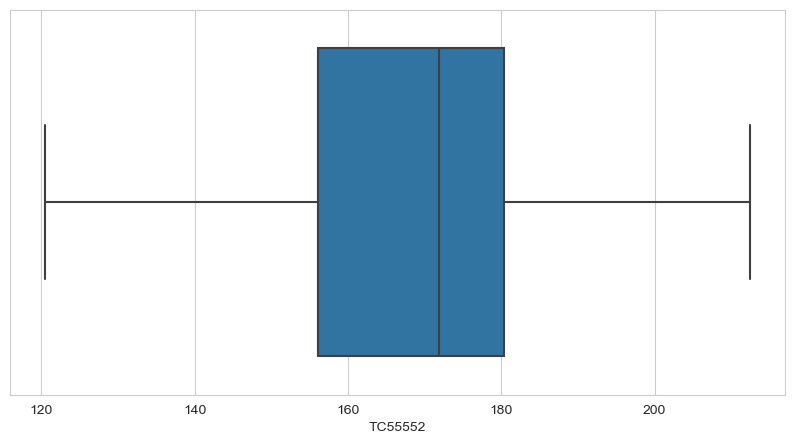

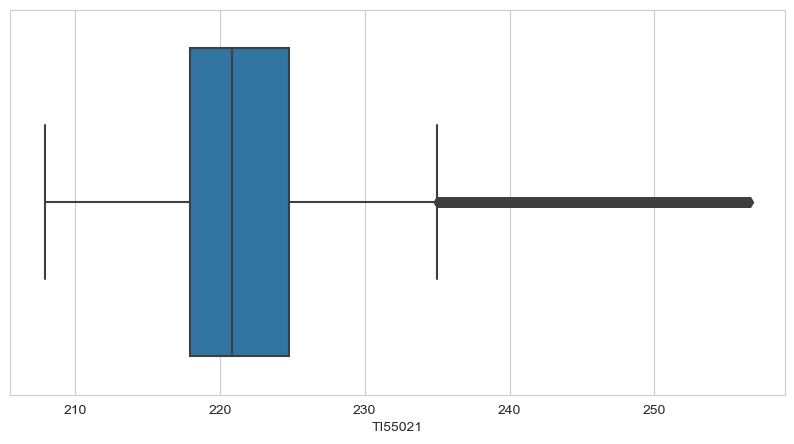

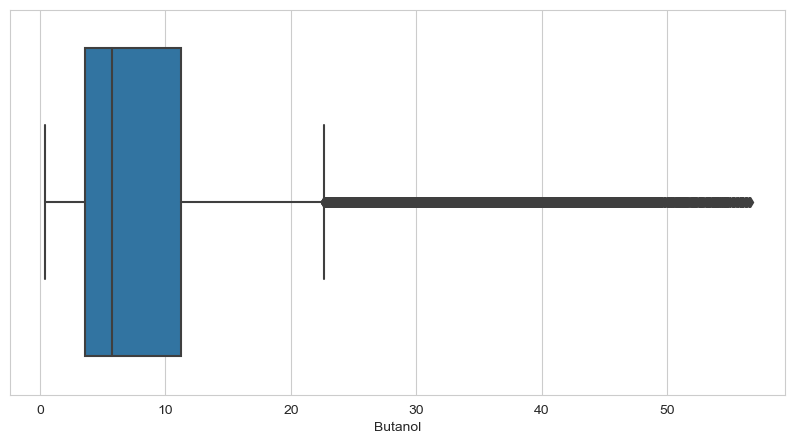

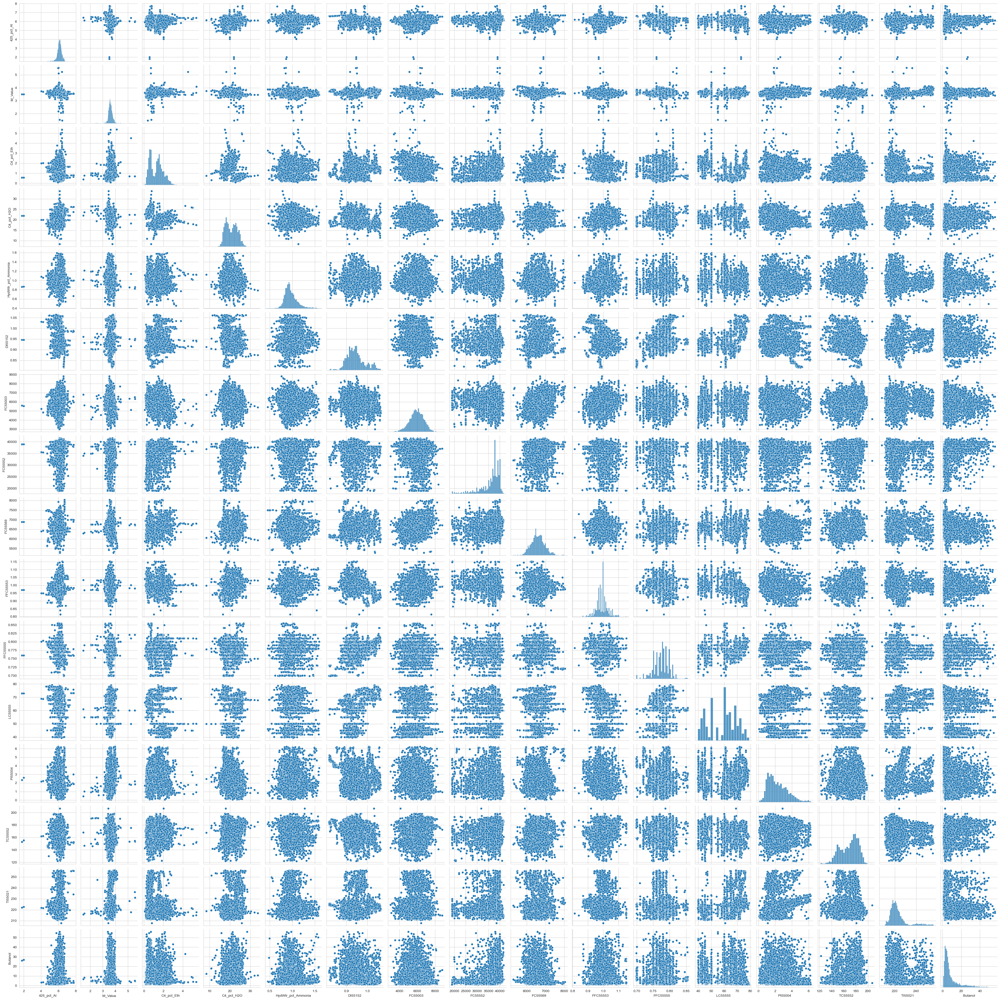

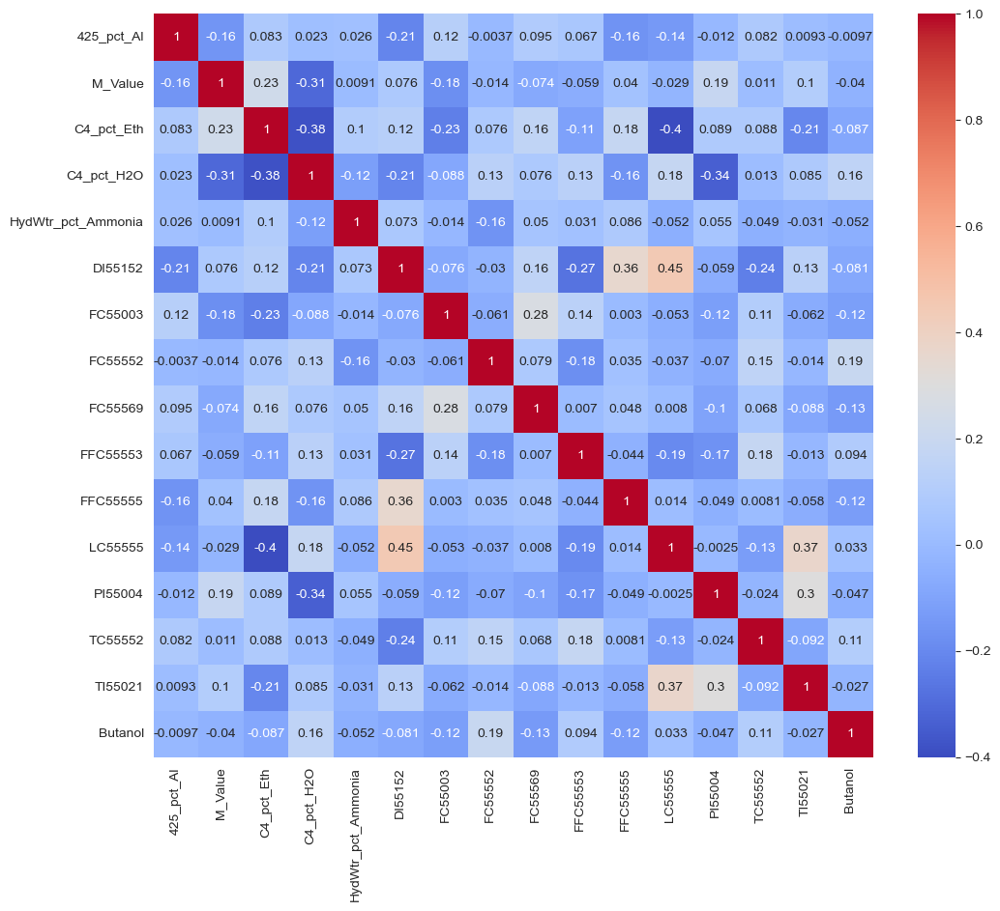

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_All is your DataFrame and is already loaded in your environment.

# Set the aesthetic style of the plots
sns.set_style('whitegrid')

# Histograms for all numerical columns
df_All.hist(bins=30, figsize=(20, 15))
plt.show()

# Boxplots for all numerical columns
for column in df_All.select_dtypes(include='number').columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df_All[column])
    plt.show()

# Pair plot for all columns
# Note: This can be very resource-intensive if there are many columns, consider sampling or reducing dimensions
sns.pairplot(df_All.sample(frac=0.1, random_state=1)) # Adjust 'frac' as necessary
plt.show()

# Correlation heatmap
plt.figure(figsize=(12, 10))
correlation_matrix = df_All.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

# Count plots for all categorical columns
for column in df_All.select_dtypes(include='object').columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df_All, x=column)
    plt.xticks(rotation=90)  # Rotate labels if they overlap
    plt.show()

# Ensure that the following line is the last line in your script to display the plots
plt.show()


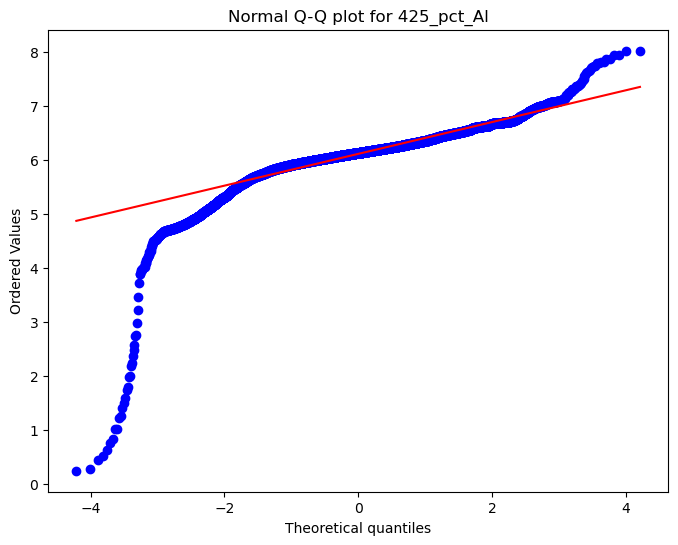

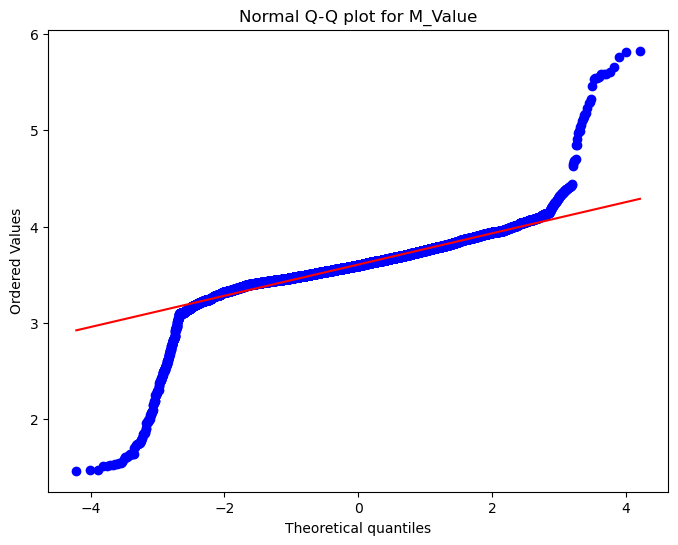

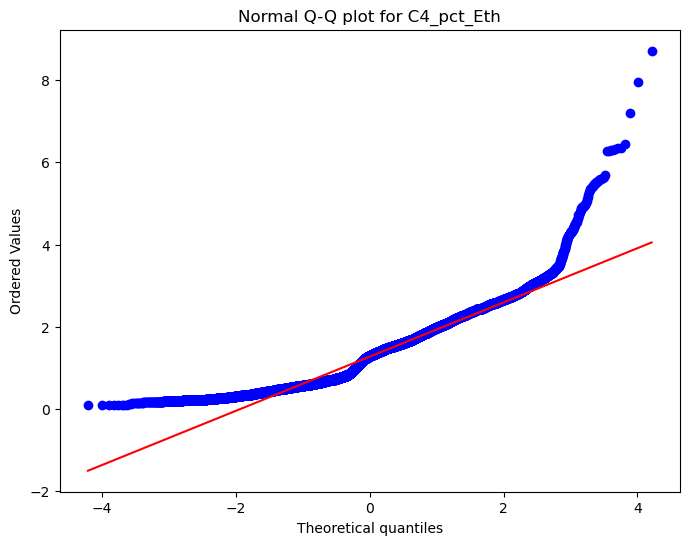

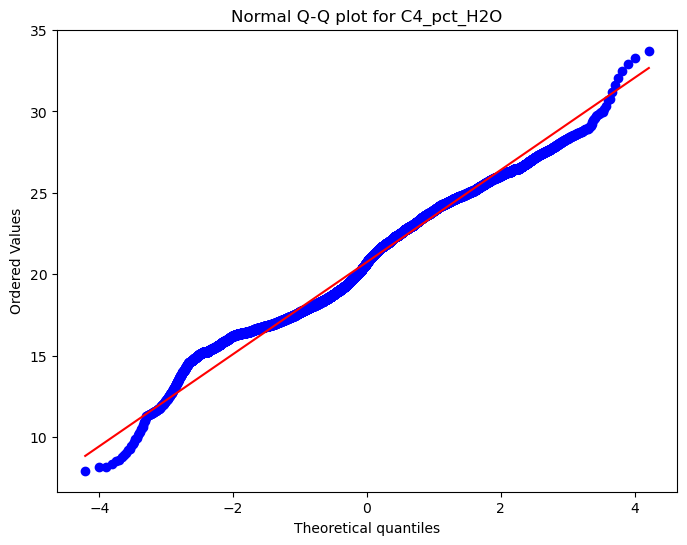

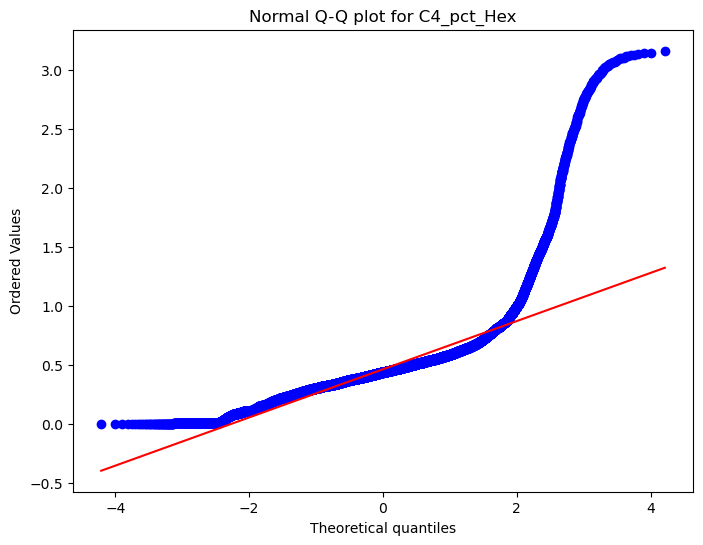

...

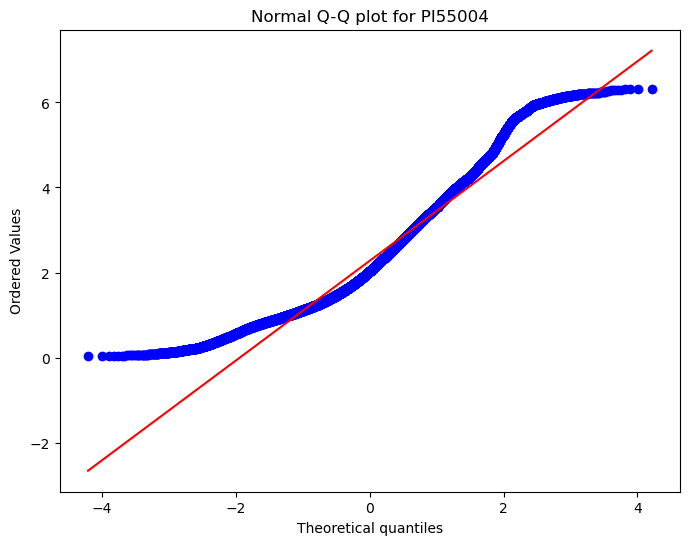

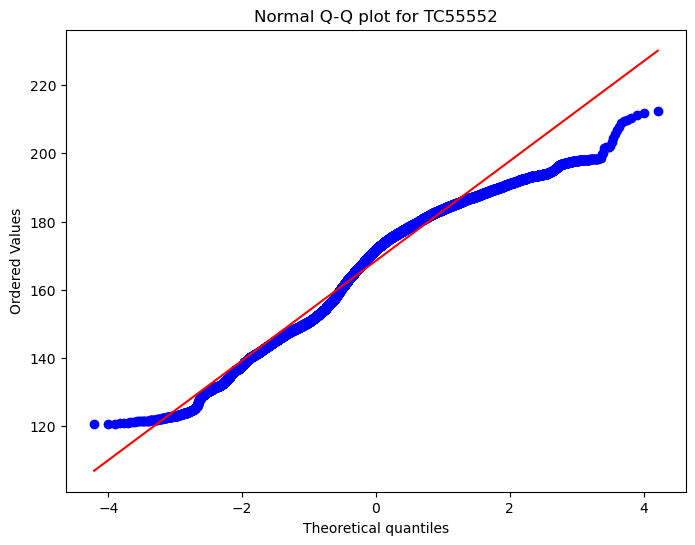

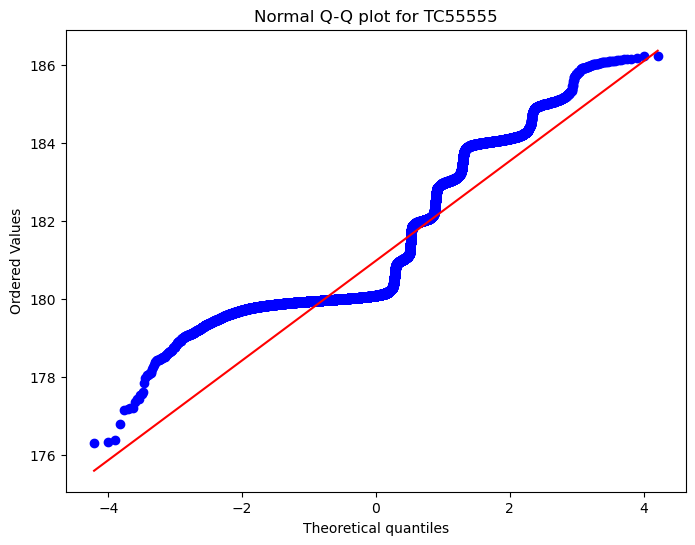

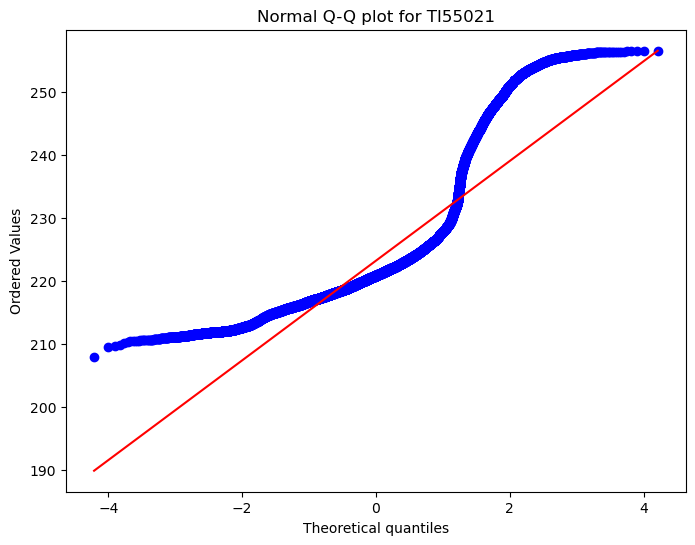

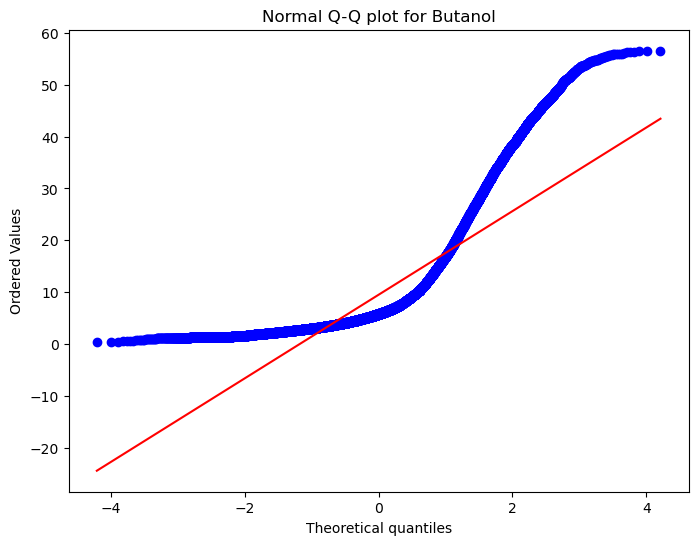

In [4]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Loop through each column except 'Date'
for col in df_All.columns:
    if col != 'Date':
        plt.figure(figsize=(8, 6))
        stats.probplot(df_All[col], dist="norm", plot=plt)
        plt.title(f"Normal Q-Q plot for {col}")
        plt.show()


In [ ]:
import pandas as pd

# Assuming df_CD is your DataFrame
non_date_columns = df_CD.columns[df_CD.columns != 'Date']

# Drop rows where any value (excluding 'Date') is 0 or less
df_CD_cleaned = df_CD.drop(df_CD[(df_CD[non_date_columns] < 5).any(axis=1)].index)

print(df_CD_cleaned)


ID                   Date     FC55009  FC55569    FFC55553    FFC55555  \
84    2012-05-12 12:00:00   471.86200  6355.42   164.76000    17.66100   
1057  2012-06-22 01:00:00  1049.66000  6367.51  1405.40000   517.96000   
2688  2012-08-29 00:00:00   777.84600  5832.79  1721.62000     6.73813   
3755  2012-10-12 11:00:00   503.34500  2031.18   169.02900   498.93800   
4128  2012-10-28 00:00:00   785.41800  7811.79   668.26400   235.62800   
7523  2013-03-18 12:00:00     5.29369  6093.79  1035.90000    64.27190   
7904  2013-04-03 09:00:00  1004.72000  6559.36  2955.15000     5.61322   
8231  2013-04-17 00:00:00    19.51310  6557.75   103.13200   294.66000   
8247  2013-04-17 16:00:00   843.94400  6696.42  1266.40000   607.20300   
10134 2013-07-05 07:00:00     6.24934  6630.54  1222.39000   347.82300   
10135 2013-07-05 08:00:00     5.77286  6782.75   297.75000    19.36990   
10313 2013-07-12 18:00:00    21.24260  6720.69   991.25900    44.20320   
10405 2013-07-16 14:00:00    12.53520 

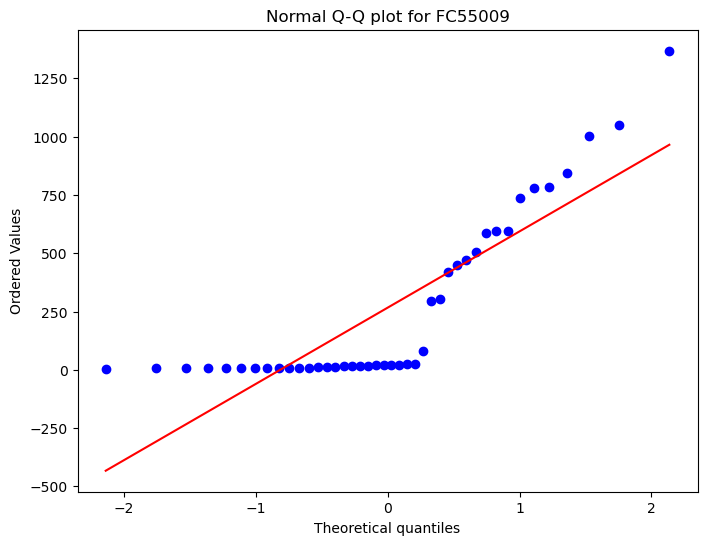

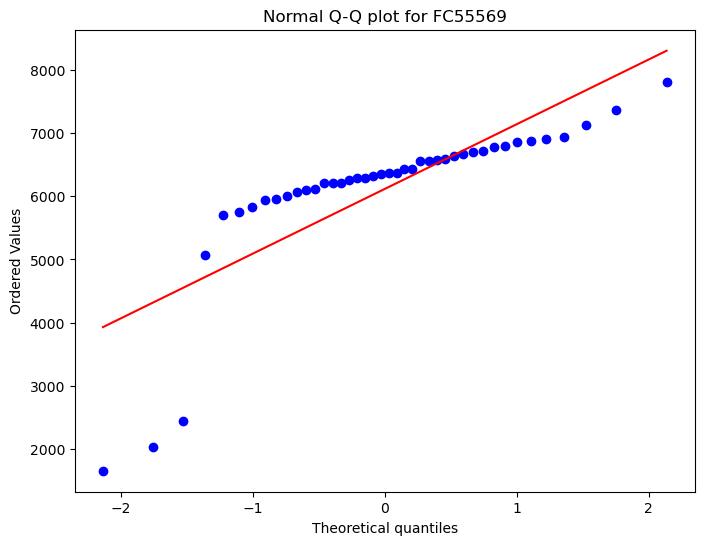

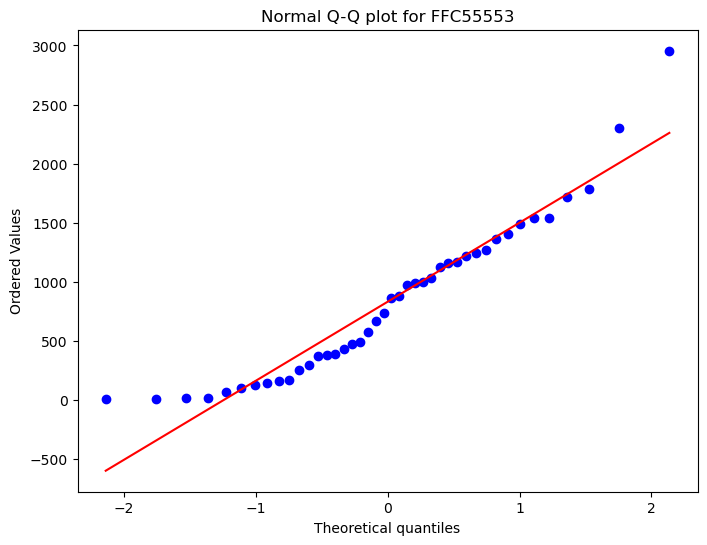

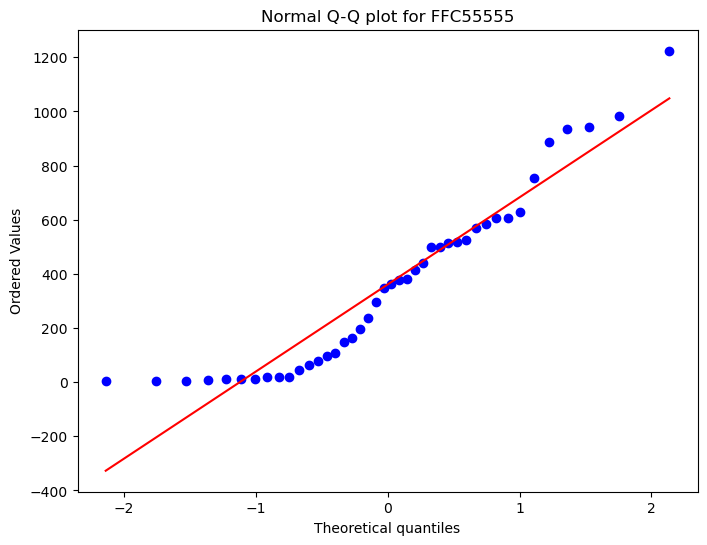

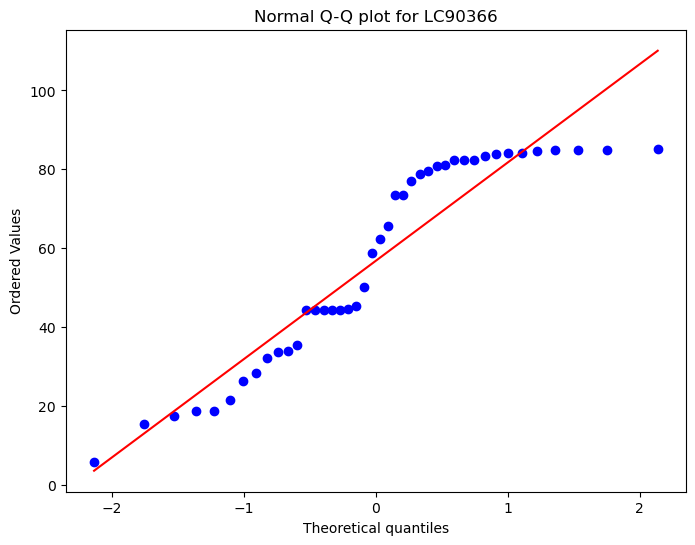

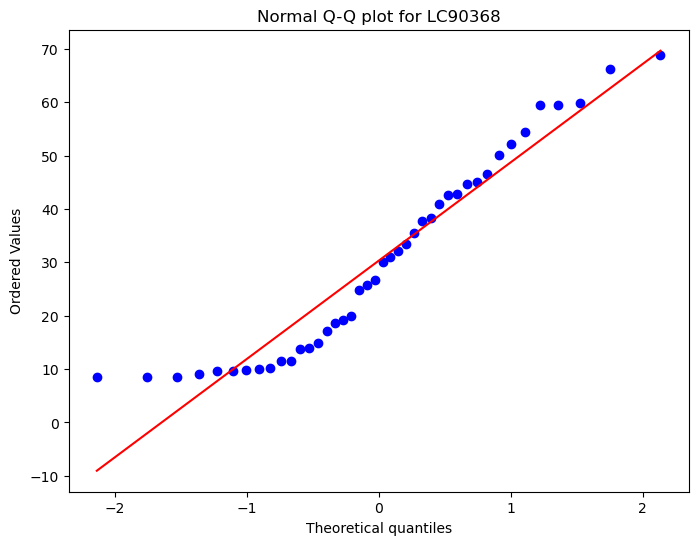

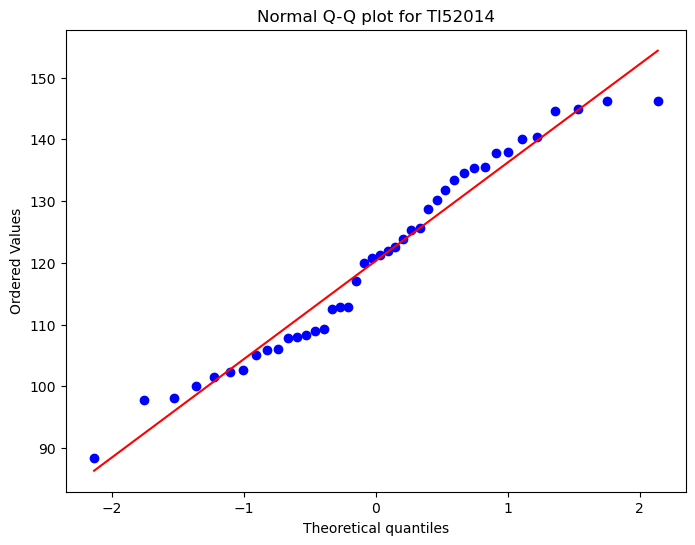

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Loop through each column except 'Date'
for col in df_CD_cleaned.columns:
    if col != 'Date':
        plt.figure(figsize=(8, 6))
        stats.probplot(df_CD_cleaned[col], dist="norm", plot=plt)
        plt.title(f"Normal Q-Q plot for {col}")
        plt.show()
